<a href="https://colab.research.google.com/github/SihaoCheng/scattering_transform/blob/master/scattering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook gives examples of how to 1. compute the scattering transform and scattering covariance coefficients; 2. perform image synthesis (or called generative model) using the scattering covariance. 

The printed time cost for each section is measured using a V100 GPU with google colab.

# Install and Import

In [1]:
# run it any time you want to have last version of the code
!rm -rf '/content/scattering_transform/'
!git clone 'https://github.com/SihaoCheng/scattering_transform.git' '/content/scattering_transform'

Cloning into '/content/scattering_transform'...
remote: Enumerating objects: 1336, done.
remote: Counting objects: 100% (286/286), done.
remote: Compressing objects: 100% (148/148), done.
remote: Total 1336 (delta 199), reused 192 (delta 138), pack-reused 1050
Receiving objects: 100% (1336/1336), 185.88 MiB | 37.00 MiB/s, done.
Resolving deltas: 100% (841/841), done.


In [2]:
# mount google drive
# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

# import packages
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.fft

# change the path below to where you download the scattering package
import sys
sys.path.append('/content/scattering_transform/')
# import os
# os.chdir('/content/scattering')

# import scattering package
import scattering

# change the path below to where you download the data
# data_dir = '/content/drive/MyDrive/Colab Notebooks/'

use torch backend


# 1. Compute summary statistics

## 1.1 Scattering transform and covariance

In [ ]:
# define calculator 
# the default device is gpu. If no gpu is found, it will automatically use cpu. 
# To enforce use of cpu, set device='cpu' when defining the calculator
M = N = 256; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L) 

# load image (should have a shape of [N_image, N_xpix, N_ypix], 
# with a type of either numpy array or torch tensor.)
image_input = np.load(scattering.dirpath + '/example_fields.npy')[0:1,:M,:N]

# calculate scattering statistics (mean and correlation)
s_mean = st_calc.scattering_coef(image_input)
s_cov  = st_calc.scattering_cov (image_input)

# size of flattened isotropic scattering (mean) coefs,
# and flattened isotropic scattering correlation coefs 
# and size of index of flattened scattering covariance coefs
print(
    s_mean['for_synthesis_iso'].shape, 
    s_cov['for_synthesis_iso'].shape,
    s_cov['index_for_synthesis_iso'].shape
)

torch.Size([1, 119]) torch.Size([1, 1471]) torch.Size([7, 1471])


## 1.2 Scattering covariance between 2 fields

In [ ]:
# define calculator 
# the default device is gpu. If no gpu is found, it will automatically use cpu.
# to enforce use of cpu, set device='cpu' when defining the calculator)
M = N = 256; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L) 

# load image (image1,2 should have a shape of [N_image, N_xpix, N_ypix])
image1 = np.load(scattering.dirpath + '/example_fields.npy')[0:1,:M,:N]
image2 = np.load(scattering.dirpath + '/example_fields.npy')[1:2,:M,:N]

# calculate scattering correlations, including 1-field-auto and 2-field-cross terms
s_cov_2fields = st_calc.scattering_cov_2fields(image1, image2)
print('size of isotropic scattering correlations: ', s_cov_2fields['for_synthesis_iso'].shape)
print('size of isotropic C11 coef: ', s_cov_2fields['Corr11_iso'].shape)

size of isotropic scattering correlations:  torch.Size([1, 5406])
size of isotropic C11 coef:  torch.Size([1, 4, 7, 7, 7, 4, 4])


## 1.3 Other statistics

In [ ]:
# load image (should have a shape of [N_image, N_xpix, N_ypix])
M = N = 256; J = 7; L = 4
image_input = np.load(scattering.dirpath + '/example_fields.npy')[:1,:M,:N]

# alpha-scattering (cov)
ac_calc = scattering.AlphaScattering2d_cov(M, N, J, L)

# bispectrum
bi_calc = scattering.Bispectrum_Calculator(M, N, bins=10, bin_type='linear',)
# bi_calc = scattering.Bispectrum_Calculator(M, N, k_range=np.logspace(0,np.log10(M/2*1.4), J-1))

# calculate estimators
alpha_cov = ac_calc.forward(image_input)
print('size of alpha_cov coefficients: ', alpha_cov.shape)

bi = bi_calc.forward(image_input)
print('size of bispectrum coefficients: ', bi.shape)

number of moments (without low-pass and harr):  44096
this chunk 0  size is  832  among  832
size of alpha_cov coefficients:  torch.Size([1, 10870])
size of bispectrum coefficients:  torch.Size([1, 150])


# 2. Build generative models

## 2.1 single-field generation (1-to-1)

input_size:  (2, 256, 256)
# of estimators:  11705
max residual:  7.040534 , mean residual:  0.016961478
max residual:  0.010017467 , mean residual:  0.00027076577
time used:  31.666014432907104 s


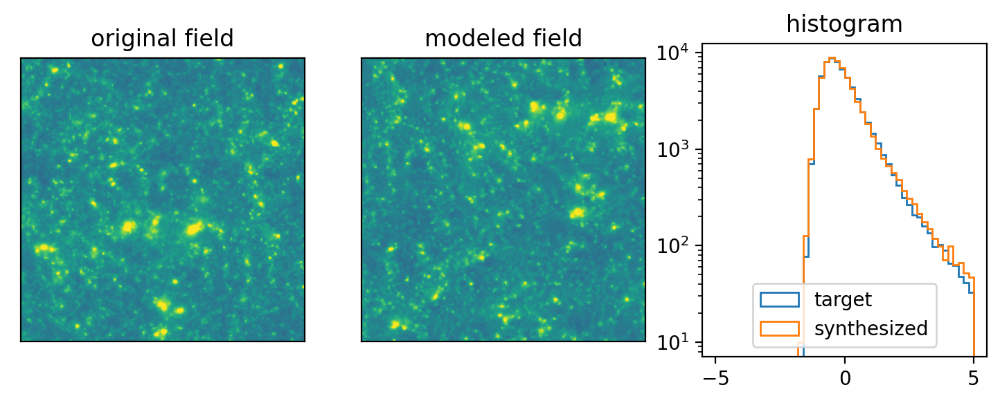

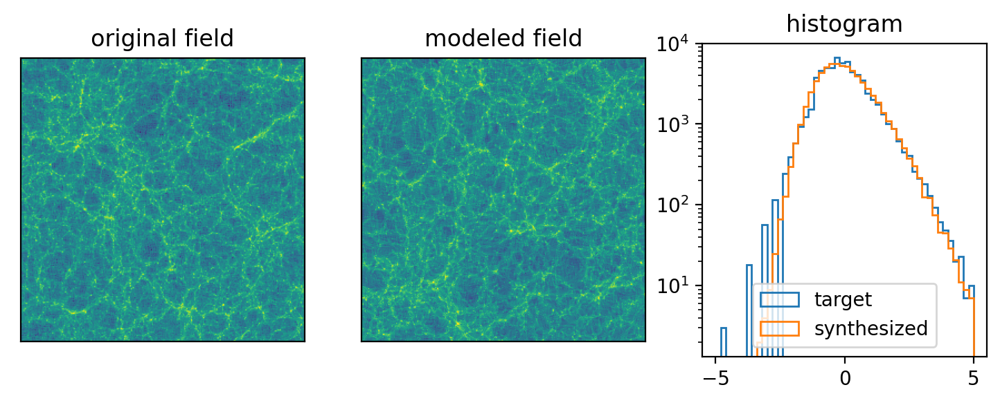

In [ ]:
# 1-to-1 generation means that we generate one field matching the statistics of one given field. 
# if the input is a set of fields, then the 1-to-1 mode will synthesise them independently

# load image
image_target = scattering.whiten(np.load(scattering.dirpath + '/example_fields.npy')[:2])

# synthesize
image_syn = scattering.synthesis('s_cov', image_target, seed=0)

# show
scattering.show(image_target, image_syn, (-5, 5))

## 2.2 ensemble generation (N-to-N')

input_size:  (20, 256, 256)
# of estimators:  1471
max residual:  3.7055364 , mean residual:  0.020818103
max residual:  0.00016474724 , mean residual:  1.6764801e-05
time used:  49.00821256637573 s


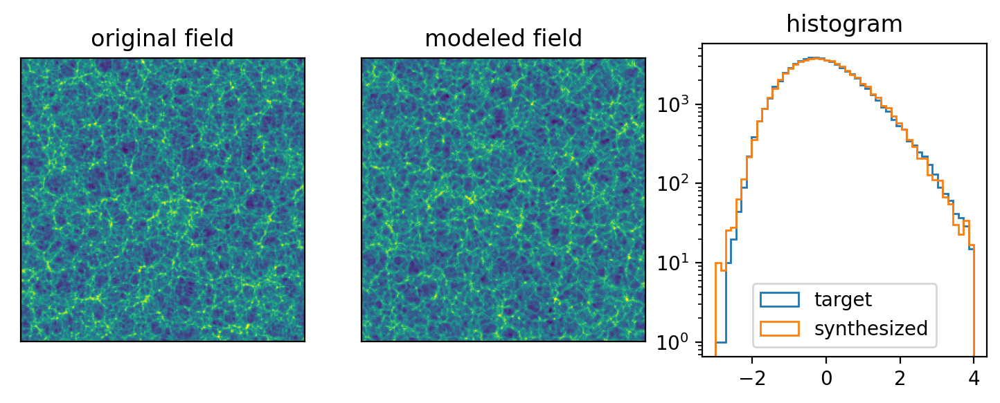

In [ ]:
# N-to-N' generation means that we generate N' field whose averaged statistics 
# matches the averaged statistics of N' given fields. 
# The input fields should be different realizations of the same random field

# here we use N=20, N'=10 as an example
Np = 10

# load a set of 20 cosmic web fields
image_target = scattering.whiten(
    np.load(scattering.dirpath + '/cosmic_web_20.npy'), overall=True)

# synthesize
image_syn = scattering.synthesis(
    's_cov_iso', image_target, seed=0, ensemble=True, N_ensemble=Np)

# show
# Note that the field generation is not 1-to-1. We are just randomly showing 
# one example from the 20 original fields and one from the 10 generated fields.
scattering.show(image_target[:1], image_syn[:1], (-3, 4))

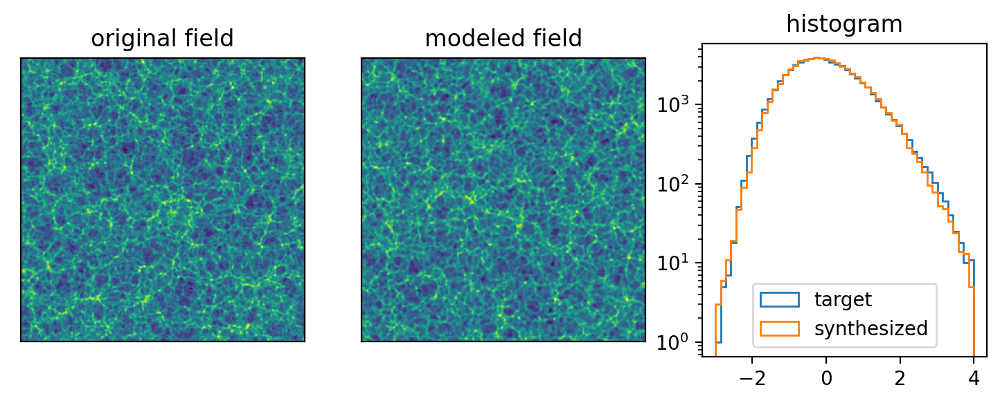

In [ ]:
# There are some high frequency (>0.8 of nyquist frequency), checker-grid-like artifacts
# in the generated field because the smallest wavelet has a decaying tail in Fourier space
# beyond that frequency. A frequency cutoff (smoothing) can remove those artifacts.
scattering.show(
    scattering.filter_radial(image_target[:1], lambda k:k<128*0.8),
    scattering.filter_radial(image_syn[:1], lambda k:k<128*0.8),
    (-3, 4)
)

## 2.3 threshold clipping generation

input_size:  (20, 256, 256)
# of estimators:  220
max residual:  3.787354 , mean residual:  0.47872078
max residual:  0.00069603696 , mean residual:  0.000101301084
time used:  50.451284646987915 s


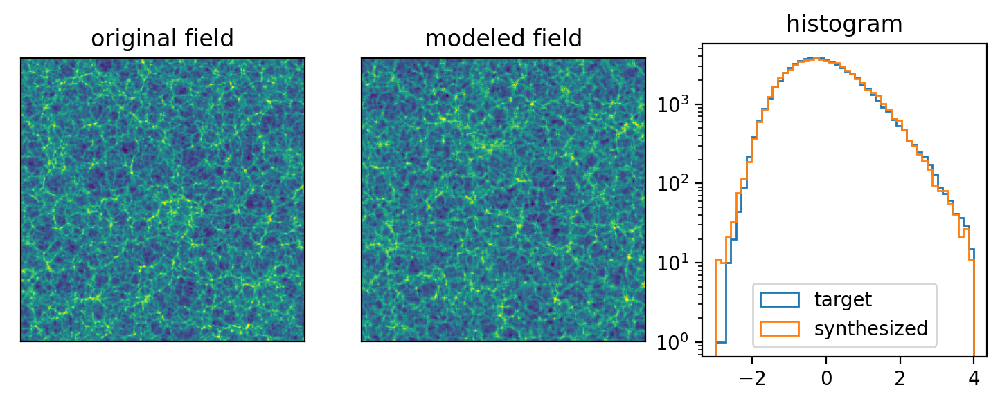

In [6]:
# load a set of 20 cosmic web fields
image_target = scattering.whiten(np.load(scattering.dirpath + '/cosmic_web_20.npy'), overall=True)

# get scattering coefficients
M, N, J, L = image_target.shape[-2], image_target.shape[-1], 7, 4
st_calc = scattering.Scattering2d(M, N, J, L)
s_cov = scattering.chunk_model(image_target, st_calc, nchunks=10) 
# same as "s_cov = st_calc.scattering_cov(image_target)" but avoid memory problem

# compute the thresholding selection
threshold_list = [2] # set a list of thresholding sigma
_, _, _, threshold_func, mask_list = scattering.prepare_threshold_func(s_cov, threshold_list)
mask = mask_list[0]

# set N' of the emsemble generation (N-to-N')
Np = 10

# synthesis
image_syn = scattering.synthesis(
    's_cov_func', image_target, seed=0, ensemble=True, N_ensemble=Np,
    s_cov_func=threshold_func, s_cov_func_params=mask, J=J, L=L)

# show
scattering.show(image_target[:1], image_syn[:1], (-3, 4))

### more flexible code using "estimator" mode

# of estimators:  220
max residual:  3.6627798 , mean residual:  0.47490817
max residual:  0.0006689625 , mean residual:  9.419316e-05
time used:  92.84871220588684 s


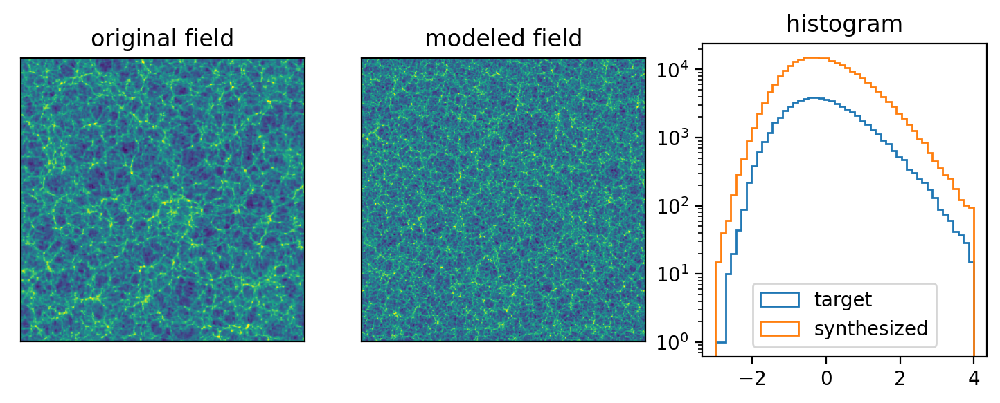

In [35]:
# or, the following code will do the same thing, but using the "estimator" mode,
# which means we specify the target estimator values instead of target images.

# prepare reference power spectrum for normalization and prepare target coef
P00 = torch.exp(s_cov['for_synthesis'][:,1:1+J*L].mean(0).reshape((1,J,-1)))
target_coef = threshold_func(s_cov, mask).mean(0)[None,:].cuda()
# synthesis
image_syn = scattering.synthesis(
    's_cov_func', target_coef, seed=0, ensemble=True, N_ensemble=Np,
    s_cov_func=threshold_func, s_cov_func_params=mask, J=J, L=L, 
    mode='estimator', M=M*2, N=N*2, reference_P00=P00.cuda())
# note that we can specify the size of generated fields now,
# which is set to be (M*2, N*2) in this example
# if we set it back to (M, N), this example give the same result as the above code

# show
scattering.show(image_target[:1], image_syn[:1], (-3, 4)) 
# note that image_syn[0] now has a size of (M*2, N*2) = (512, 512), four times larger
# than the original field.

## 2.4 interpret coefficients by generation

### example 1: interpolation between textures

# of estimators:  1471
max residual:  1.2190745 , mean residual:  0.011140096
max residual:  0.0038144458 , mean residual:  0.00013555356
time used:  26.179776430130005 s


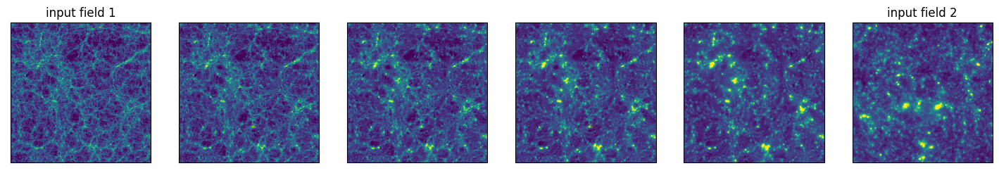

In [15]:
# load two images
M = N = 256; J = 7; L = 4
image_target1 = scattering.whiten(np.load(scattering.dirpath + '/example_fields.npy')[1:2,:M,:N])
image_target2 = scattering.whiten(np.load(scattering.dirpath + '/example_fields.npy')[0:1,:M,:N])

# calculate scattering correlations coefficients for each of them
st_calc = scattering.Scattering2d(M, N, J, L)
s_cov1 = st_calc.scattering_cov(image_target1)
s_cov2 = st_calc.scattering_cov(image_target2)

# linearly interpolate the coefficients between image1 and image2
coef_target_list = []
param_list = [0.75, 0.5, 0.25, 0.]
for factor in param_list:
    coef_target_list.append(
        factor * s_cov1['for_synthesis_iso'] + (1-factor) * s_cov2['for_synthesis_iso'])

# synthesize based on the values of interpolated coefficients
image_syn = scattering.synthesis(
    's_cov_iso', mode='estimator', M=M, N=N, J=J, L=L, 
    target=torch.cat(coef_target_list, dim=0),
    image_init=image_target1 * np.ones((len(param_list),1,1)),
    steps=200, seed=0
)

# plot result
image_series = np.concatenate(
    (image_target1[0:1], image_syn, image_target2[0:1]), axis=0)

plt.figure(figsize=(len(image_series)*3,3),dpi=100)
for i in range(len(image_series)):
    plt.subplot(1,len(image_series),i+1)
    plt.imshow(image_series[i], vmin=-1.5, vmax=5)
    if i == 0: plt.title('input field 1')
    if i == len(image_series)-1: plt.title('input field 2')
    plt.xticks([]); plt.yticks([])

### example 2: artificially increase or decrease some coefficients

In [77]:
# load image
select = np.array([0,1,3,5])
image_target = scattering.whiten(
    np.load(scattering.dirpath + '/example_fields.npy')[select,:M,:N])

# define calculators
M, N, J, L = image_target.shape[-2], image_target.shape[-1], 7, 4
st_calc = scattering.Scattering2d(M, N, J, L)

# calculate estimators
s_cov_set = st_calc.scattering_cov(image_target)
index_type, j1, j2, j3, l1, l2, l3 = s_cov_set['index_for_synthesis']

# excluding S1, because it depends on others
def func_noS1(s_cov_set, param):
    return s_cov_set['for_synthesis'][:,index_type!=2]

# of estimators:  11677
max residual:  0.47305894 , mean residual:  0.0061290143
max residual:  0.37475896 , mean residual:  0.0021635273
time used:  44.79551029205322 s


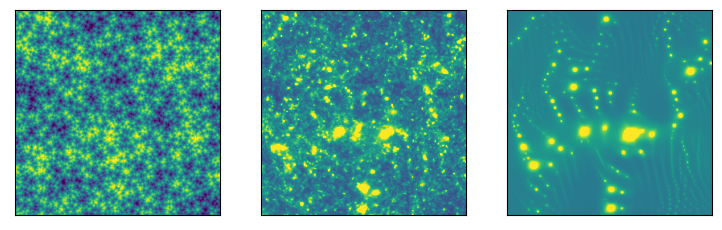

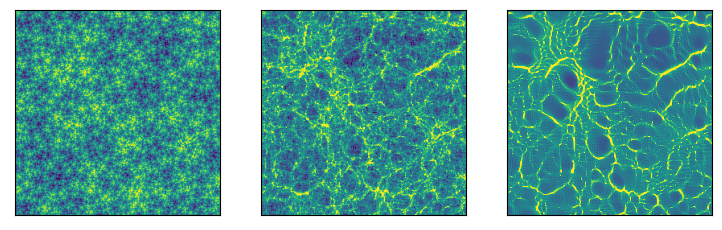

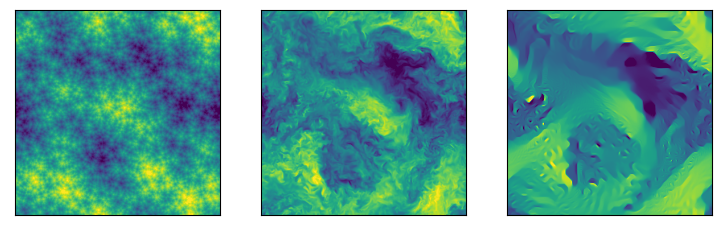

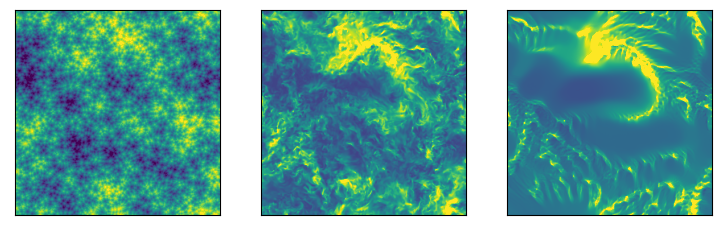

In [81]:
# change the overal amplitude of both C01 and C11 coefficients
s_cov_list = []
param_list = [0, 1, 3]
for factor in param_list:
    s_cov = s_cov_set['for_synthesis']*1.
    s_cov[:,(index_type==3)+(index_type==4)] *= factor # C01 are scaled by factor
    s_cov[:,(index_type==5)+(index_type==6)] *= factor # C11 are scaled by factor
    for i in range(len(s_cov)): s_cov_list.append(s_cov[i:i+1])

# synthesize based on values of coefficients
N_param = len(param_list)
image_syn = scattering.synthesis(
    's_cov_func', mode='estimator', M=M, N=N, J=J, L=L, s_cov_func=func_noS1,
    target=torch.cat(s_cov_list, dim=0)[:,index_type!=2], 
    image_init=(image_target[None,...] * np.ones((N_param,1,1,1))).reshape(-1,M,N),
)

# plot result
for idx_img in range(len(image_target)): 
    plt.figure(figsize=(len(param_list)*3,3), dpi=100)
    for i in range(len(param_list)):
        plt.subplot(1, len(param_list), i+1)
        plt.imshow(image_syn[idx_img+len(image_target)*i], vmin=-2.5, vmax=2.5)
        plt.xticks([]); plt.yticks([])
    plt.show()

# of estimators:  1464
max residual:  0.09292482 , mean residual:  0.0026876873
max residual:  0.03229658 , mean residual:  0.0010969115
time used:  84.18135929107666 s


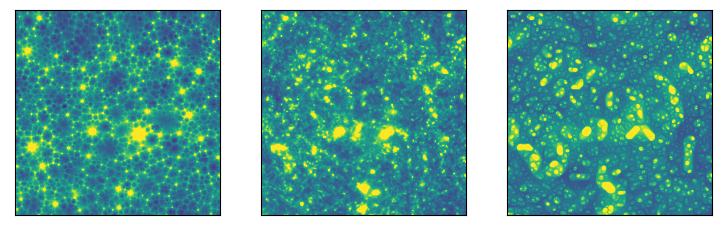

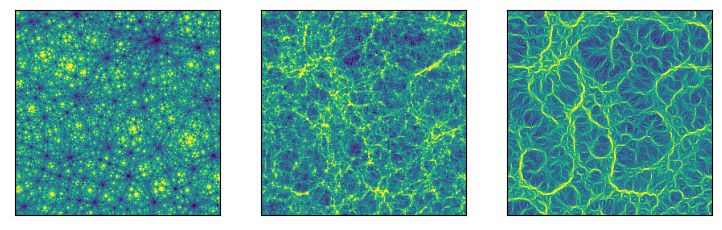

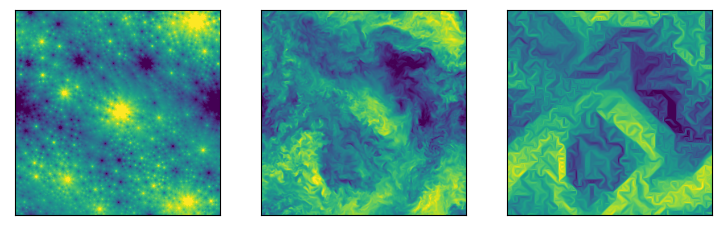

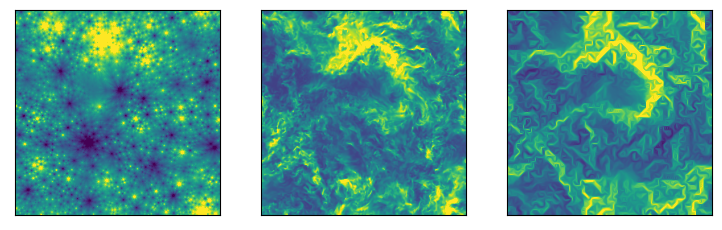

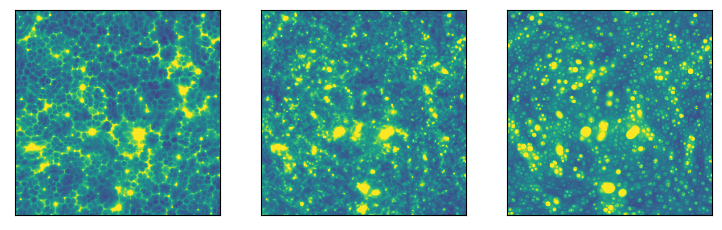

...

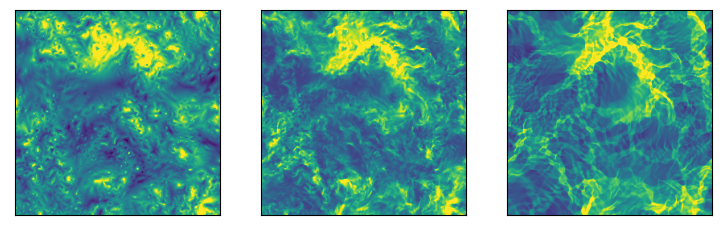

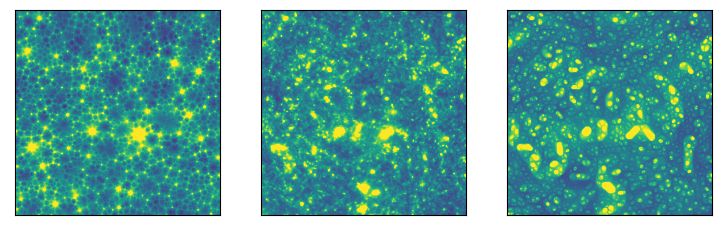

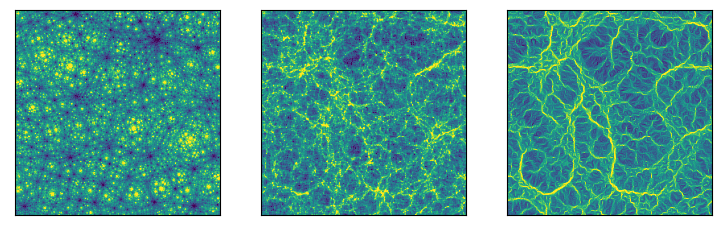

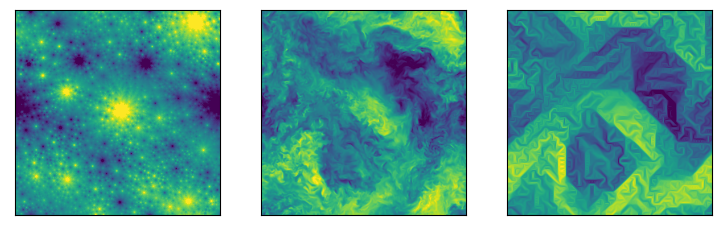

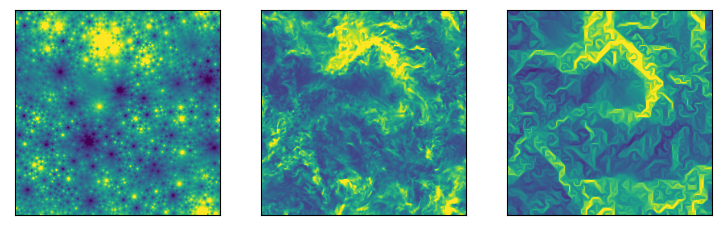

In [44]:
# change the orientation amplitude of C01 and C11

s_cov_list = []
param_list1 = [-2, 0, 2]
for factor in param_list1:
    s_cov = scattering.modify_angular(
        s_cov_set, factor, C01=True, C11=True, keep_para=False, ref_along='j12')
    for i in range(len(s_cov)): s_cov_list.append(s_cov[i:i+1])

param_list2 = [-2, 0, 2]
for factor in param_list2:
    s_cov = scattering.modify_angular(
        s_cov_set, factor, C01=True, C11=True, keep_para=False, ref_along='j13')
    for i in range(len(s_cov)): s_cov_list.append(s_cov[i:i+1])

param_list3 = [-2, 0, 2]
for factor in param_list3:
    s_cov = scattering.modify_angular(
        s_cov_set, factor, C01=True, C11=True, keep_para=False, ref_along='both')
    for i in range(len(s_cov)): s_cov_list.append(s_cov[i:i+1])

# synthesize based on values of coefficients
N_image = len(param_list1) + len(param_list2) + len(param_list3)
image_syn = scattering.synthesis(
    's_cov_func_iso', mode='estimator', M=M, N=N, J=J, L=L, s_cov_func=func_noS1,
    target=torch.cat(s_cov_list, dim=0)[:,index_type!=2], 
    image_init=(image_target[None,...] * np.ones((N_image,1,1,1))).reshape(-1,M,N).copy()
)
# plot
start_index = [0, len(param_list1), len(param_list1)+len(param_list2)]
for list_index, param_list in enumerate([param_list1, param_list2, param_list3]):
    if len(param_list)!=0:
        for idx_img in range(len(image_target)): 
            plt.figure(figsize=(len(param_list)*3,3), dpi=100)
            for i in range(len(param_list)):
                plt.subplot(1,len(param_list),i+1)
                plt.imshow(image_syn[idx_img+len(image_target)*(i+start_index[list_index])], vmin=-2.5, vmax=2.5)
                plt.xticks([]); plt.yticks([])
            plt.show()

## 2.5 two-field generation using cross scattering covariance

In [8]:
# load image
image_target = np.load(scattering.dirpath + '/example_fields.npy')[3:4]
image_b      = np.load(scattering.dirpath + '/example_fields.npy')[4:5]

# synthesize
image_syn = scattering.synthesis('s_cov_2fields_iso', mode='image', 
    target=image_target, image_b=image_b, image_init='random phase',
    steps=800, seed=0,
)

input_size:  (1, 256, 256)
# of estimators:  4054
max residual:  0.2826448 , mean residual:  0.0044252905
max residual:  0.00038711657 , mean residual:  3.3152115e-05
time used:  208.23576378822327 s


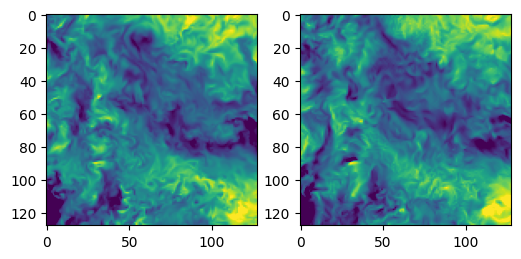

In [11]:
plt.figure(figsize=(6,3),dpi=100)
plt.subplot(121); plt.imshow(image_target[0,:128,:128], vmin=-1.5, vmax=1.5)
plt.subplot(122); plt.imshow(image_syn   [0,:128,:128], vmin=-1.5, vmax=1.5)
plt.show()

### for comparison: single field synthesis

input_size:  (1, 256, 256)
# of estimators:  1471
max residual:  0.1281147 , mean residual:  0.003472347
max residual:  0.0027849297 , mean residual:  0.0001015621
time used:  39.699474573135376 s


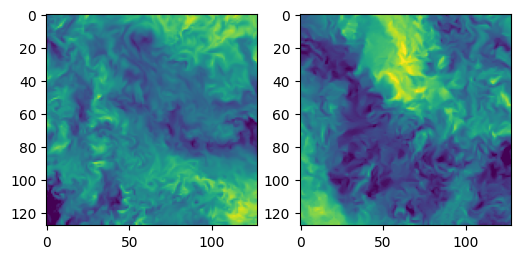

In [3]:
# load image
image_target = np.load(scattering.dirpath + '/example_fields.npy')[3:4] # z-velocity of turbulence
image_b      = np.load(scattering.dirpath + '/example_fields.npy')[4:5] # pressure of turbulence
# s_cov_iso single field
image_syn = scattering.synthesis('s_cov_iso', image_target, seed=0, image_init='random phase')
# plot
plt.figure(figsize=(6,3),dpi=100)
plt.subplot(121); plt.imshow(image_target[0,:128,:128], vmin=-2, vmax=2)
plt.subplot(122); plt.imshow(image_syn   [0,:128,:128], vmin=-2, vmax=2)
plt.show()